# Visualise DoD2k

This notebook reads the resulting compact dataframe for dod2k produces a series of plots which show some information on the dataframe entries (reproduces figures and supplementary figures as in the publication).

This can also be checked for sanity against the original publications.

The notebook can also be modified to visualise the original dataframes (PAGES 2k, SISAL, FE23, CH2k, Iso2k).


Author: Lucie Luecke
Date produced: 18/11/2024

Input: 
reads dataframe with the following keys:
  - ```archiveType```
  - ```dataSetName```
  - ```datasetId```
  - ```geo_meanElev```
  - ```geo_meanLat```
  - ```geo_meanLon```
  - ```geo_siteName```
  - ```interpretation_direction``` (new in v2.0)
  - ```interpretation_variable```
  - ```interpretation_variableDetail```
  - ```interpretation_seasonality``` (new in v2.0)
  - ```originalDataURL```
  - ```originalDatabase```
  - ```paleoData_notes```
  - ```paleoData_proxy```
  - ```paleoData_sensorSpecies```
  - ```paleoData_units```
  - ```paleoData_values```
  - ```paleoData_variableName```
  - ```year```
  - ```yearUnits```
  - (optional: `DuplicateDetails`)



## Set up working environment

Make sure the repo_root is added correctly, it should be: your_root_dir/dod2k
This should be the working directory throughout this notebook (and all other notebooks).

In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
from pathlib import Path

# Add parent directory to path (works from any notebook in notebooks/)
# the repo_root should be the parent directory of the notebooks folder
current_dir = Path().resolve()
# Determine repo root
if current_dir.name == 'dod2k': repo_root = current_dir
elif current_dir.parent.name == 'dod2k': repo_root = current_dir.parent
else: raise Exception('Please review the repo root structure (see first cell).')

# Update cwd and path only if needed
if os.getcwd() != str(repo_root):
    os.chdir(repo_root)
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

print(f"Repo root: {repo_root}")
if str(os.getcwd())==str(repo_root):
    print(f"Working directory matches repo root. ")

Repo root: /home/jupyter-lluecke/dod2k
Working directory matches repo root. 


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature 
from matplotlib.gridspec import GridSpec as GS
from copy import deepcopy as dc

from dod2k_utilities import ut_functions as utf # contains utility functions
from dod2k_utilities import ut_plot as uplt # contains plotting functions

## read dataframe

Read compact dataframe.

{db_name} refers to the database, including
  - database of databases:
    - dod2k_v2.0 (dod2k: duplicate free, merged database)
    - dod2k_v2.0_MT (filtered for MT sensitive proxies only)
    - all_merged (NOT filtered for duplicates, only fusion of the input databases)
  - original databases:
    - fe23
    - ch2k
    - sisal
    - pages2k
    - iso2k

All compact dataframes are saved in {repo_root}/data/{db_name} as {db_name}_compact.csv.

In [3]:
# read dataframe, choose from the list below, or specify your own

db_name = 'dod2k_v2.0'
# db_name = 'pages2k'
# load dataframe
df = utf.load_compact_dataframe_from_csv(db_name)
print(df.info())
df.name = db_name


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4781 entries, 0 to 4780
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   archiveType                    4781 non-null   object 
 1   dataSetName                    4781 non-null   object 
 2   datasetId                      4781 non-null   object 
 3   duplicateDetails               4781 non-null   object 
 4   geo_meanElev                   4699 non-null   float32
 5   geo_meanLat                    4781 non-null   float32
 6   geo_meanLon                    4781 non-null   float32
 7   geo_siteName                   4781 non-null   object 
 8   interpretation_direction       4781 non-null   object 
 9   interpretation_seasonality     4781 non-null   object 
 10  interpretation_variable        4781 non-null   object 
 11  interpretation_variableDetail  4781 non-null   object 
 12  originalDataURL                4781 non-null   o

define colours

In [4]:
cols = [ '#4477AA', '#EE6677', '#228833', '#CCBB44', '#66CCEE', '#AA3377', '#BBBBBB', '#44AA99', '#332288']

## visualise

### bar chart of dataset composition (for archive and proxy types)

How many entries does each archive type have?

In [5]:
# count archive types
archive_count = {}
for ii, at in enumerate(set(df['archiveType'])):
    archive_count[at] = df.loc[df['archiveType']==at, 'archiveType'].count()

Specify colour for each archive (smaller archives get grouped into the same colour)

In [6]:
sort = np.argsort([cc for cc in archive_count.values()])
archives_sorted = np.array([cc for cc in archive_count.keys()])[sort][::-1]

archive_colour, major_archives, other_archives = uplt.get_archive_colours(archives_sorted, archive_count, cols)


0 Wood 3477
1 Speleothem 567
2 Coral 310
3 GlacierIce 162
4 MarineSediment 125
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1


How many entries does each proxy type have, per archive?

Results in dictionary with two levels: archive_proxy_count[archive][proxy]

In [7]:
archive_proxy_count = {}
archive_proxy_ticks = []
for ii, at in enumerate(set(df['archiveType'])):
    proxy_types   = df['paleoData_proxy'][df['archiveType']==at].unique()
    for pt in proxy_types:
        cc = df['paleoData_proxy'][(df['paleoData_proxy']==pt)&(df['archiveType']==at)].count()
        archive_proxy_count['%s: %s'%(at, pt)] = cc
        archive_proxy_ticks += [at+': '+pt]

How many entries does each proxy type have per archive? When bundling the rare ones into 'other'

Plot the major proxy types per archive in descending order. Omit the rare archive types (less than ten records)

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_proxy_count_short.pdf


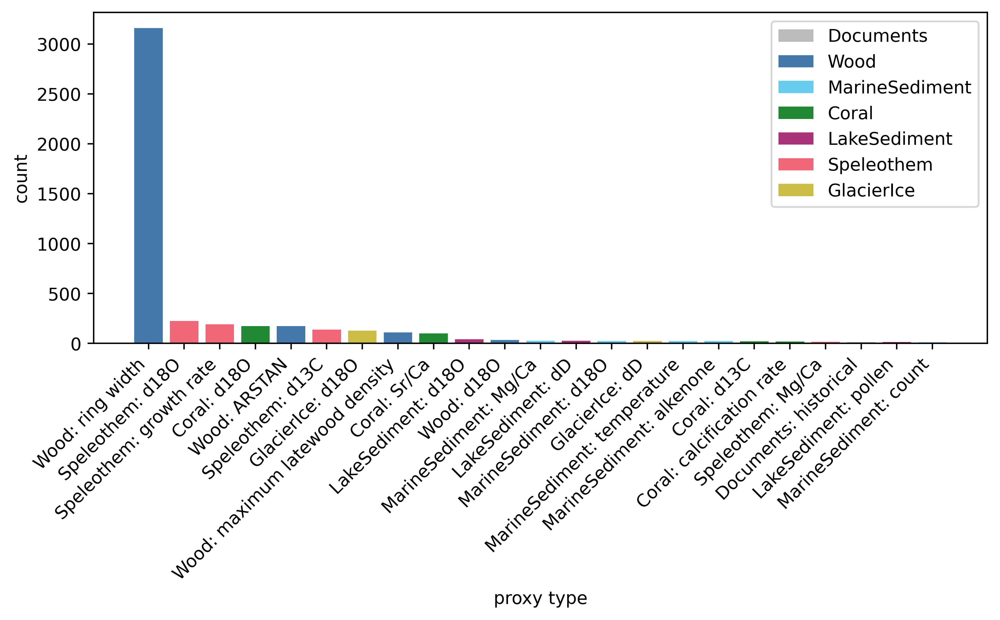

In [8]:
# plot a bar chart of the number of proxy types included in the dataset

fig = uplt.plot_count_proxy_by_archive_short(df, archive_proxy_count, archive_proxy_ticks, archive_colour) 

utf.save_fig(fig, '%s_proxy_count_short'%df.name, dir=f'{df.name}')


Plot all counts per archive per proxy types, including the rare ones, in descending order.

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_proxy_count_long.pdf


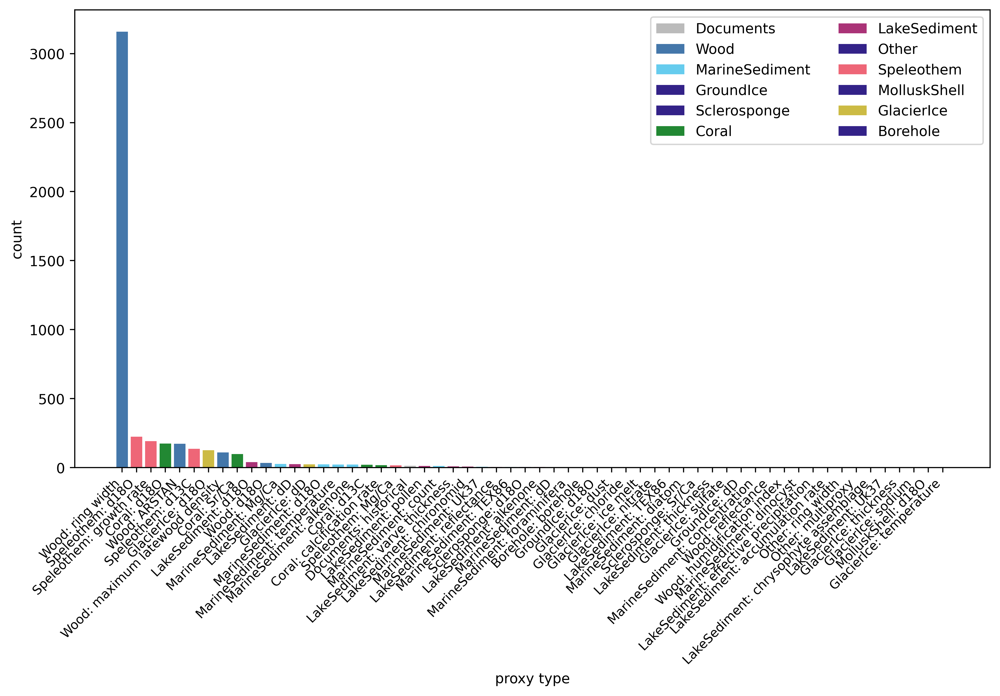

In [9]:
# plot a bar chart of the number of proxy types included in the dataset

fig = uplt.plot_count_proxy_by_archive_all(df, archive_proxy_count, archive_proxy_ticks, archive_colour)

utf.save_fig(fig, '%s_proxy_count_long'%df.name, dir=f'{df.name}')


## temporal availability of database, by archive type

Visualise the availability of archive types over time (rare archive types are bundled together as other archives)

Plot the coverage over the Common Era

1. logarithmic
2. linear

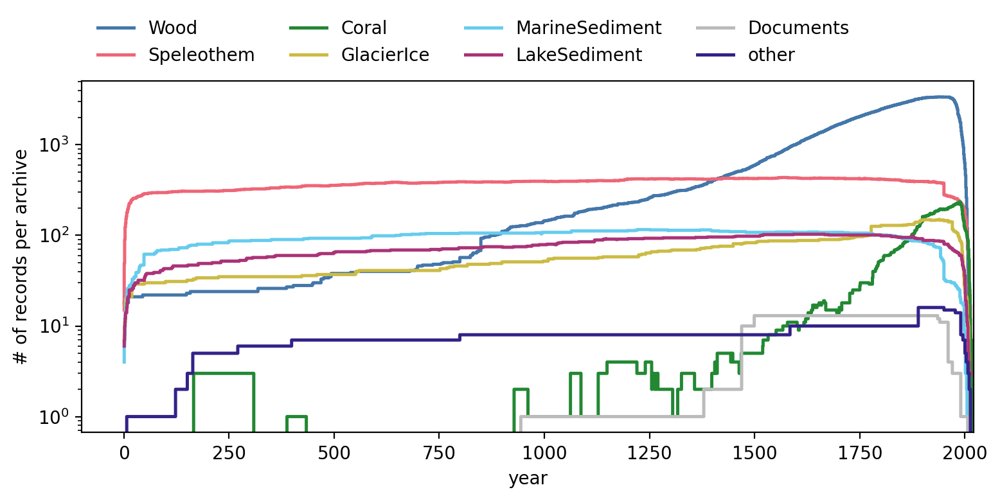

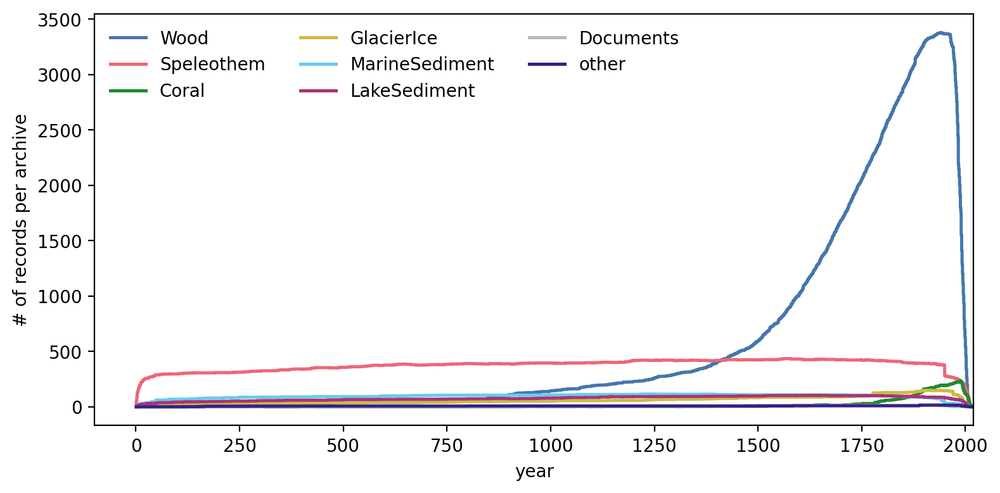

In [10]:
for ysc in ['log', 'linear']:
    fig, years, coverage, coverage_by_archive = uplt.plot_coverage(df, archives_sorted, major_archives, other_archives, archive_colour, 
                                              ysc=ysc, return_data=True)


Compare the availability over the Common Era to PAGES 2k- compute the coverage etc as above but for PAGES 2k

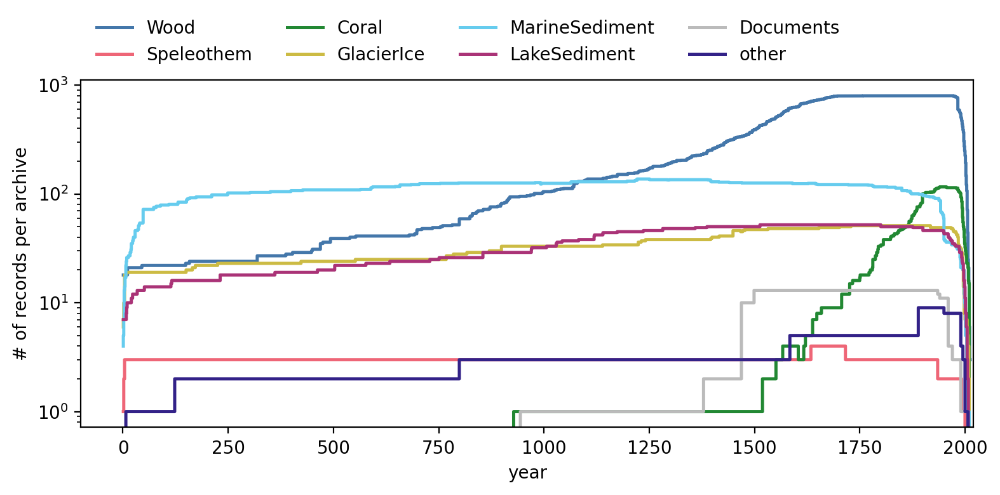

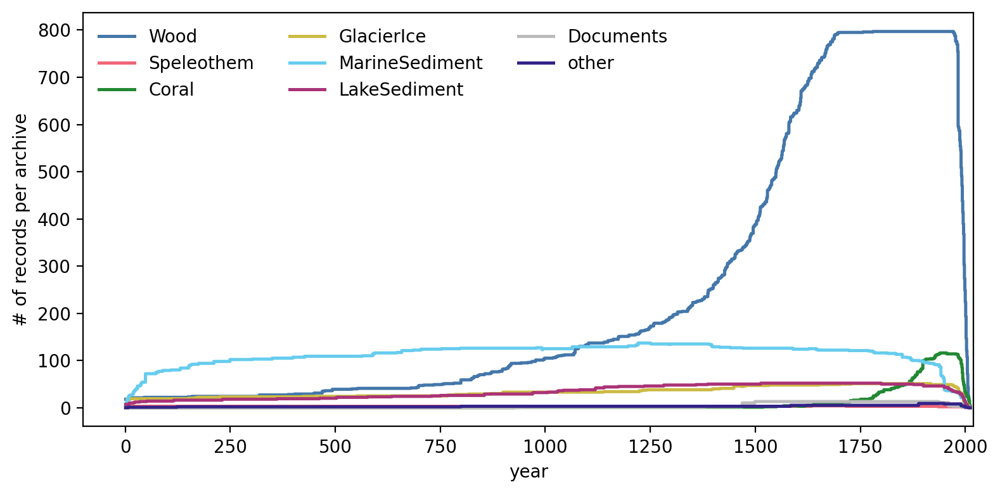

In [11]:
#%% plot the coverage of all records and coverage per archive 
# FOR PAGES2k!!!!

df_pages = utf.load_compact_dataframe_from_csv('pages2k')


for ysc in ['log', 'linear']:
    fig, years_pages, coverage_pages, coverage_by_archive_pages = uplt.plot_coverage(df_pages, archives_sorted, 
                                                                                     major_archives, other_archives, 
                                                                                     archive_colour, ysc=ysc, 
                                                                                     return_data=True)


# MinY_pages    = np.array([min([float(sy) for sy in yy])  for yy in df_pages['year']]) # find minimum year for each record
# MaxY_pages    = np.array([max([float(sy) for sy in yy])  for yy in df_pages['year']]) # find maximum year for each record
# years_pages   = np.arange(min(MinY_pages), max(MaxY_pages)+1)

# # generate array of coverage (how many records are available each year, in total)
# coverage_pages = np.zeros(years_pages.shape[0])
# for ii in range(len(df_pages['year'])):
#     coverage_pages[(years_pages>=MinY_pages[ii])&(years_pages<=MaxY_pages[ii])] += 1

In [12]:
# # generate array of coverage for each archive type
# # FOR PAGES2k!!!!

# coverage_by_archive_pages = {arch: np.zeros(years_pages.shape[0]) for arch in major_archives+['other'] }
# for arch in set(df_pages['archiveType']):
#     arch_mask = df_pages['archiveType']==arch 
#     for ii in range(len(df_pages[arch_mask]['year'])):
#         if arch not in major_archives: arch='other'
#         cc = coverage_by_archive_pages[arch]
#         coverage_by_archive_pages[arch][(years_pages>=MinY_pages[arch_mask][ii])&(years_pages<=MaxY_pages[arch_mask][ii])] += 1
        

Plot the coverage of PAGES 2k and DoD2k over the Common Era

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_temporal_avail_compared_to_PAGES2k_LOG.pdf


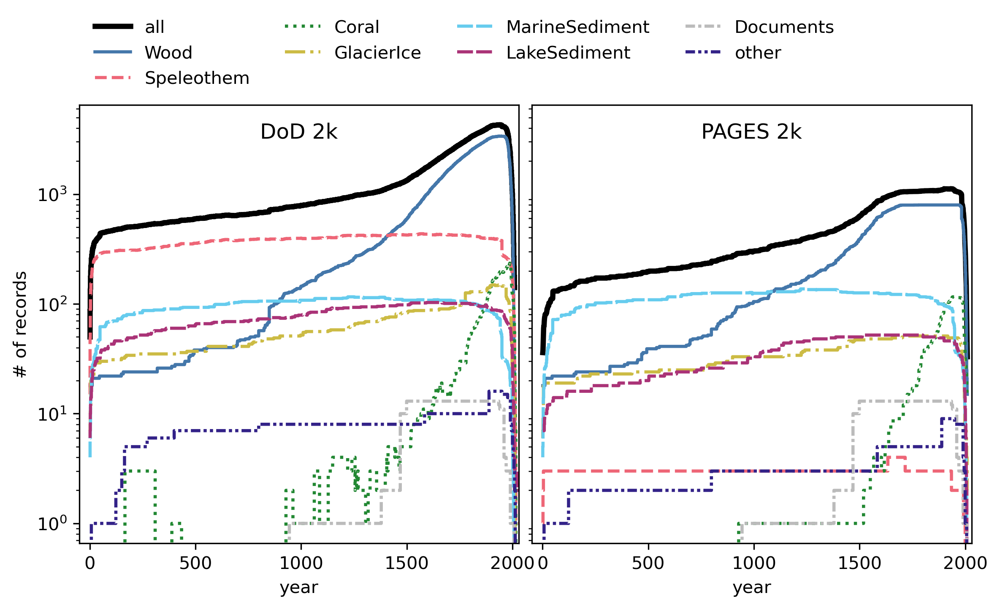

In [13]:
ysc='log'

fig = plt.figure(figsize=(8, 5), dpi=300)
grid = GS(9,2)
ax1 = plt.subplot(grid[1:,0])
ax2 = plt.subplot(grid[1:,1])
ymask  = (years>=1)&(years<=2010)
ypmask = (years_pages>=1)&(years_pages<=2010)
ax1.step(years[ymask], coverage[ymask], color='k', label='all', lw=3)
ax2.plot(years_pages[ypmask], coverage_pages[ypmask], color='k', label='all', lw=3)#, dashes=[2,1,1,1])

ax1.set_title('DoD 2k', y=0.9)
ax2.set_title('PAGES 2k', y=0.9)

for ax in [ax1, ax2]:
    ax.set_xlabel('year')
    
    ax.set_xlim(-50, 2030)
    ax.grid(False)

linestyles=['-','--',':','-.', (5, (10, 1)),  (0, (5, 1)),  (0, (3, 1, 1, 1)), (0, (3, 1, 1, 1, 1, 1)) ]*2
            
for ii, arch in enumerate(major_archives+['other']):
    ax1.step(years, coverage_by_archive[arch], color=archive_colour[arch],
             label=arch+'', lw=1.8, ls=linestyles[ii])
    ax2.step(years_pages[ypmask], 
             coverage_by_archive_pages[arch][ypmask], 
             color=archive_colour[arch], ls=linestyles[ii],#dashes=[2,1,1,1],#ls='--',
             label=arch+'', lw=1.8)
    
for ax in [ax1, ax2]:
    ax.set_yscale(ysc)

ax1.set_ylabel('# of records')
ax2.yaxis.set_ticks([])
yl = ax1.get_ylim()
ax2.set_ylim(yl)

grid.tight_layout(fig)
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
l_ax = plt.subplot(grid[0,:])
l_ax.legend(h1,l1, ncol=4, framealpha=0, bbox_to_anchor=(0,0), loc='lower left' )
l_ax.set_axis_off()

l_ax.set_axis_off()

grid.tight_layout(fig)
grid.update(hspace=0.03,wspace=0.03)

utf.save_fig(fig, f'{df.name}_temporal_avail_compared_to_PAGES2k_{ysc.upper()}', dir=df.name)

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_temporal_avail_compared_to_PAGES2k_cumulative_LOG.pdf


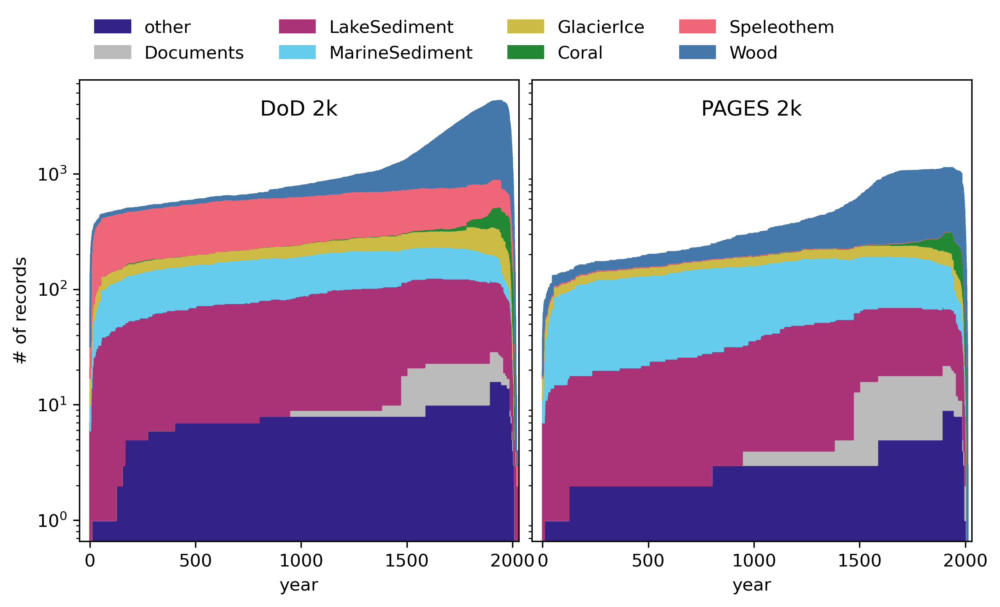

In [14]:
# plot outcome on two axis (left: total records, right: coverage per archive)
# FOR PAGES2k!!!!

ysc='log'

fig = plt.figure(figsize=(8, 5), dpi=300)
grid = GS(9,2)
ax1 = plt.subplot(grid[1:,0])
ax2 = plt.subplot(grid[1:,1])

ax1.set_title('DoD 2k', y=0.9)
ax2.set_title('PAGES 2k', y=0.9)

for ax in [ax1, ax2]:
    ax.set_xlabel('year')    
    ax.set_xlim(-50, 2030)
    ax.grid(False)


baseline = np.zeros(years.shape[0])
baseline_p = np.zeros(years_pages.shape[0])
for ii, arch in enumerate((major_archives+['other'])[::-1]):
    
    ax1.fill_between(years, baseline, baseline+coverage_by_archive[arch], 
                     step='pre', label=arch,#alpha=0.5,
                    color=archive_colour[arch])
    ax2.fill_between(years_pages, baseline_p, baseline_p+coverage_by_archive_pages[arch], 
                     step='pre', #alpha=0.5,
                    color=archive_colour[arch])
    
    baseline+=coverage_by_archive[arch]
    baseline_p+=coverage_by_archive_pages[arch]
for ax in [ax1, ax2]:
    ax.set_yscale(ysc)

ax1.set_ylabel('# of records')
ax2.yaxis.set_ticks([])

yl = ax1.get_ylim()
ax2.set_ylim(yl)


grid.tight_layout(fig)
h1, l1 = ax1.get_legend_handles_labels()
l_ax = plt.subplot(grid[0,:])
l_ax.legend(h1,l1, ncol=4, framealpha=0, bbox_to_anchor=(0,0), loc='lower left' )
l_ax.set_axis_off()

grid.tight_layout(fig)
grid.update(hspace=0.03,wspace=0.03)

utf.save_fig(fig, f'{df.name}_temporal_avail_compared_to_PAGES2k_cumulative_{ysc.upper()}', 
             dir=df.name)


## geographical coverage

Plot the distriobution of the records over the globe, colour coded by archive, marker type refers to proxy type. Count in legend.

Bundle the rare archives into 'other' and do not distinguish procy types for these.

In [15]:
archive_proxy_count_short = {}
for ii, at in enumerate(archives_sorted):
    proxy_types   = df['paleoData_proxy'][df['archiveType']==at].unique()
    if at not in archive_proxy_count_short:
        archive_proxy_count_short[at]={}
    for pt in proxy_types:
        cc = df['paleoData_proxy'][(df['paleoData_proxy']==pt)&(df['archiveType']==at)].count()
        
        if cc<=10:
            if 'other %s'%at not in archive_proxy_count_short[at]:
                archive_proxy_count_short[at]['other %s'%at]=0
            archive_proxy_count_short[at]['other %s'%at] += cc
        else:
            archive_proxy_count_short[at]['%s: %s'%(at, pt)] = cc

['Wood: ARSTAN', 'Wood: d18O', 'Wood: maximum latewood density', 'Wood: ring width', 'other Wood']
['Speleothem: Mg/Ca', 'Speleothem: d13C', 'Speleothem: d18O', 'Speleothem: growth rate']
['Coral: Sr/Ca', 'Coral: calcification rate', 'Coral: d13C', 'Coral: d18O']
['GlacierIce: d18O', 'GlacierIce: dD', 'other GlacierIce']
['MarineSediment: Mg/Ca', 'MarineSediment: alkenone', 'MarineSediment: count', 'MarineSediment: d18O', 'MarineSediment: temperature', 'other MarineSediment']
['LakeSediment: d18O', 'LakeSediment: dD', 'LakeSediment: pollen', 'other LakeSediment']
['Documents: historical']
['other Sclerosponge']
['other GroundIce']
['other Borehole']
['other Other']
['other MolluskShell']
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_spatial_short.pdf


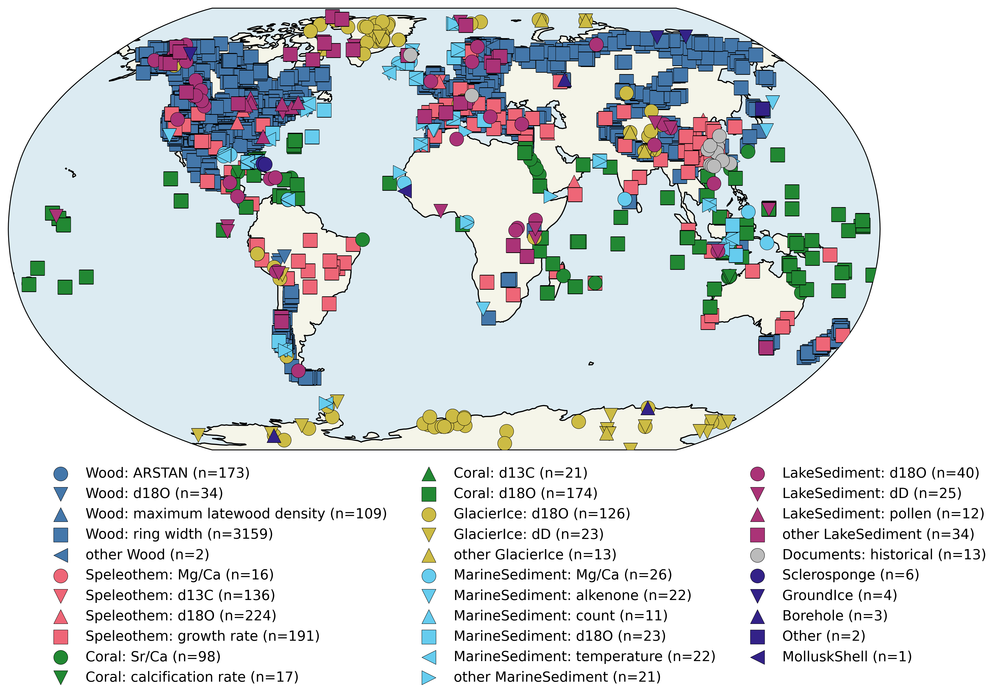

In [16]:
#%% plot the spatial distribution of all records, group short records together

fig = uplt.plot_geo_archive_proxy_short(df, archives_sorted, archive_proxy_count_short, archive_colour)

utf.save_fig(fig, f'{df.name}_spatial_short', dir=df.name)


Plot the distribution of the records over the globe, colour coded by archive, marker type refers to proxy type. Count in legend.

Show all archive and proxy types.

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_spatial_all.pdf


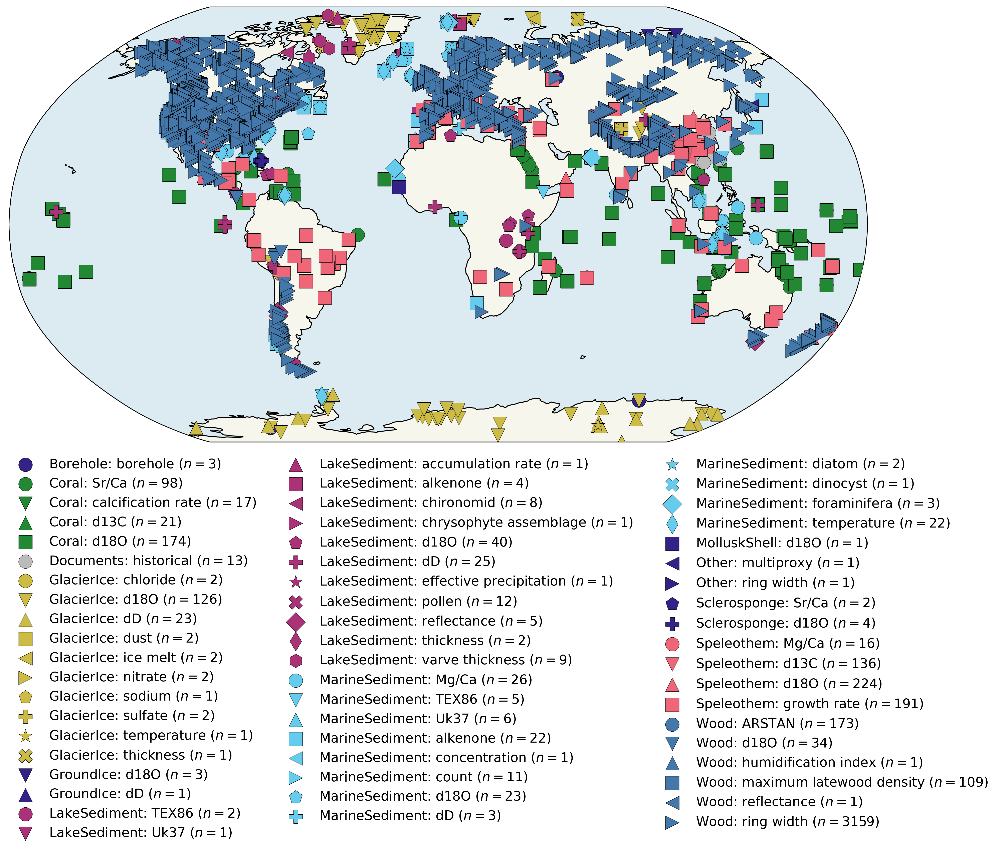

In [17]:
#%% plot the spatial distribution of all records

fig = uplt.plot_geo_archive_proxy(df, archive_colour, highlight_archives=major_archives)
utf.save_fig(fig, f'{df.name}_spatial_all', dir=df.name)


## climate interpretation 

Visualise the geographical distribution of the climate interpretation of the records where this information is available.

In [18]:
[ci for ci in set(df['interpretation_variable']) if ci not in ['N/A', 'nan']]

['moisture',
 'temperature+moisture',
 'NOT temperature NOT moisture',
 'temperature']

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_spatial_climateInterpretation.pdf


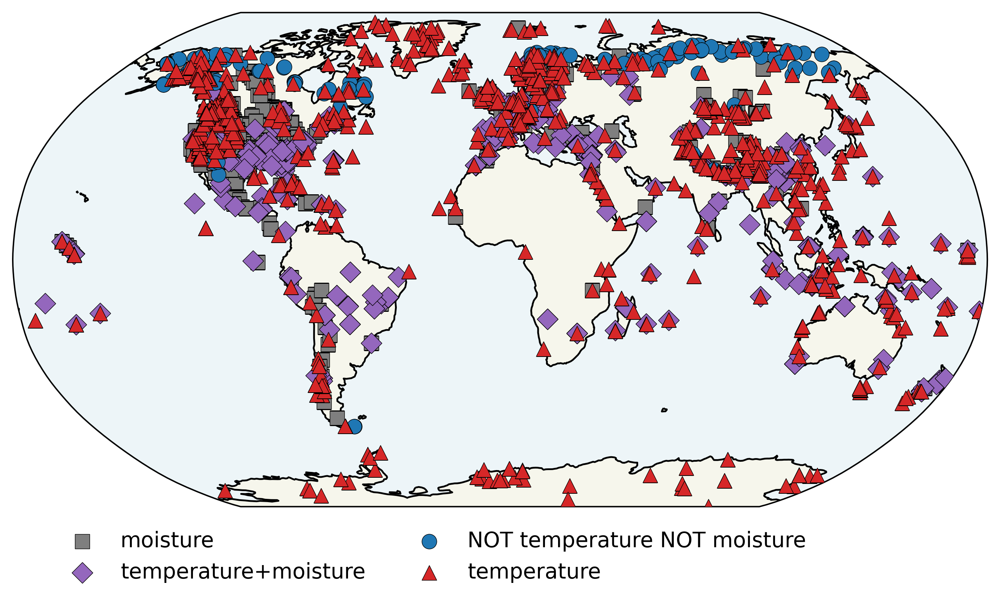

In [19]:
#%% plot the spatial distribution of all records
proxy_lats = df['geo_meanLat'].values
proxy_lons = df['geo_meanLon'].values

# plots the map
fig = plt.figure(figsize=(8, 6), dpi=350)
grid = GS(1, 3)

ax = plt.subplot(grid[:, :], projection=ccrs.Robinson()) # create axis with Robinson projection of globe

ax.add_feature(cfeature.LAND, alpha=0.5) # adds land features
ax.add_feature(cfeature.OCEAN, alpha=0.3, facecolor='#C5DEEA') # adds ocean features
ax.coastlines() # adds coastline features

ax.set_global()
mt = 'sDo^s<>pP*XDdh'*10 # generates string of marker types
colors  = ['tab:grey', 
           'tab:purple', 'tab:blue', 'tab:red']

for jj, ci in enumerate([ci for ci in set(df['interpretation_variable']) if ci in ['NOT temperature NOT moisture', 'temperature+moisture','temperature', 'moisture']]):
    ci_mask = df['interpretation_variable']==ci
    plt.scatter(proxy_lons[ci_mask], proxy_lats[ci_mask], 
                transform=ccrs.PlateCarree(), zorder=999,
                marker=mt[jj], color=colors[jj], 
                label=ci, lw=.3, ec='k', s=70)

plt.legend(bbox_to_anchor=(0.03,-0.01), loc='upper left', ncol=2, 
           fontsize=12, framealpha=0)
grid.tight_layout(fig)

utf.save_fig(fig, '%s_spatial_climateInterpretation'%df.name, dir=df.name)


## data 

Visualise the raw data for each archive.

Note this is purely for sanity purposes and might show different units on the same axis!!

So not a correct scientific visualisation. 

Better to convert to z-scores first (as in the next figure).

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_data.pdf


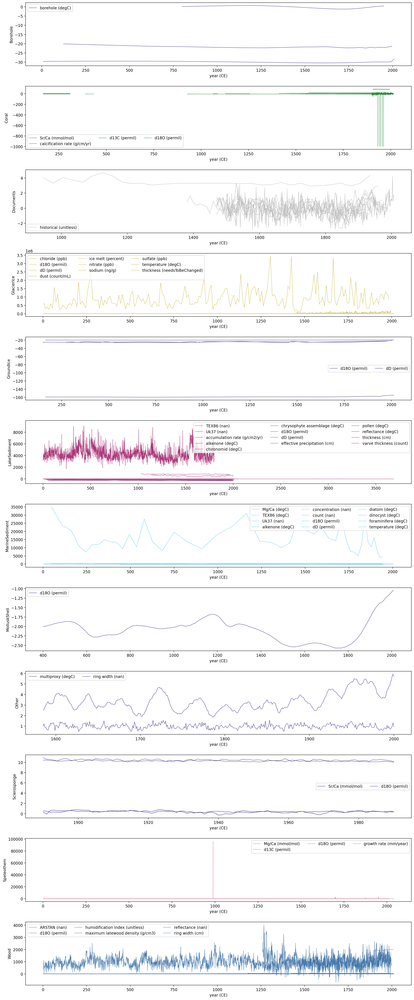

In [20]:
archive_types = np.unique(df['archiveType'])
fig = plt.figure(figsize=(15, len(archive_types)*3), dpi=200)
grid = GS(len(archive_types), 1)

# loop through the data to generate a scatter plot of each data record:
# 1st loop: go through archive types individually (determines marker type)
# 2nd loop: through paleo proxy types attributed to the specific archive, which is colour coded
for jj, at in enumerate(archive_types):
    ax = plt.subplot(grid[jj, :])
    arch_mask = df['archiveType']==at
    arch_proxy_types = np.unique(df['paleoData_proxy'][arch_mask])
    # col = f.get_colours(range(len(arch_proxy_types)), 'tab10', 0, len(arch_proxy_types))
    for ii, pt in enumerate(arch_proxy_types):
        pt_mask = df['paleoData_proxy']==pt
        at_mask = df['archiveType']==at
        df_slice = df[(df['paleoData_proxy']==pt)&(df['archiveType']==at)]
        for ijk in range(df_slice.shape[0]):
            label=f'{pt} ({df_slice.iloc[ijk]['paleoData_units']})' if ijk==0 else None
            x = np.array(df_slice.iloc[ijk]['year'], dtype=float)
            sort = np.argsort(x)
            y = np.array(df_slice.iloc[ijk]['paleoData_values'], dtype=float)
            ax.plot(x[sort], y[sort],  lw=.7, alpha=.99, label=label, color=archive_colour[at])
        ax.set_xlabel('year (%s)'%df_slice.iloc[0]['yearUnits'])
        ax.set_ylabel(at)
    ax.legend(ncol=3)
grid.tight_layout(fig)

utf.save_fig(fig, '%s_data'%df.name, dir=df.name)

/tmp/ipykernel_4063429/3134449642.py:26: RuntimeWarning: invalid value encountered in divide
  y /= np.std(y[mask])


saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0/dod2k_v2.0_data_z-scores.pdf


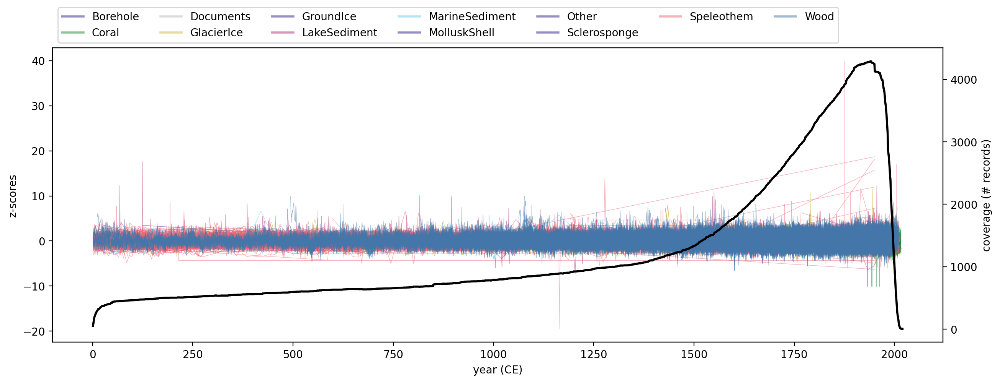

In [21]:
fig = plt.figure(figsize=(15, 5), dpi=200)

# loop through the data to generate a scatter plot of each data record:
# 1st loop: go through archive types individually (determines marker type)
# 2nd loop: through paleo proxy types attributed to the specific archive, which is colour coded
x0, x1 = 0, 2020
ax   = plt.gca()
ax2  = ax.twinx()
for jj, at in enumerate(archive_types):
    arch_mask = df['archiveType']==at
    arch_proxy_types = np.unique(df['paleoData_proxy'][arch_mask])
    col = uplt.get_colours(range(len(arch_proxy_types)), 'tab10', 0, len(arch_proxy_types))
    for ii, pt in enumerate(arch_proxy_types):
        pt_mask = df['paleoData_proxy']==pt
        at_mask = df['archiveType']==at
        df_slice = df[(df['paleoData_proxy']==pt)&(df['archiveType']==at)]
        for ijk in range(df_slice.shape[0]):
            label=at if ((ijk==0)&(ii==0)) else None
            x = np.array(df_slice.iloc[ijk]['year'], dtype=float)
            sort = np.argsort(x)
            x = x[sort]
            y = np.array(df_slice.iloc[ijk]['paleoData_values'], dtype=float)
            y = y[sort]
            mask = ((x>x0)&(x<=x1))
            y -= np.mean(y[mask])
            y /= np.std(y[mask])
            # ax = ax1 if ~np.any(y<-5000) else ax2
            ax.plot(x[mask], y[mask], lw=.5, 
                     alpha=.5, label=label, color=archive_colour[at])
        ax.set_xlabel('year (%s)'%df_slice.iloc[0]['yearUnits'])
        ax.set_ylabel('z-scores')
    leg = ax.legend(ncol=7, bbox_to_anchor=(0,1), loc='lower left')
    for line in leg.get_lines():
        line.set_lw(2)
    # ax.set_xlim(0,2020)
    #ax.set_ylim(-1000,2000)
#grid.tight_layout(fig)
ax2.plot(years[(years>=x0)&(years<=x1)], coverage[(years>=x0)&(years<=x1)], lw=2, color='k')
ax2.set_ylabel('coverage (# records)')
utf.save_fig(fig, f'{df.name}_data_z-scores', dir=df.name)
plt.show()

## Visualise original database

How many entries does each original database have?

In [22]:
# count archive types by originalDatabase (added by MNE 2025/01/07)
print(df.name)
originalDatabase_count  = {}
originalDatabase_labels = []
for ii, od in enumerate(set(df['originalDatabase'])):
    originalDatabase_count[od] = df.loc[df['originalDatabase']==od, 'paleoData_proxy'].count()
    originalDatabase_labels += [od]
    print(od, originalDatabase_count[od])

dod2k_v2.0
dod2k_composite_z 1
Iso2k v1.1.2 410
SISAL v3 528
FE23 (Breitenmoser et al. (2014)) 2728
CoralHydro2k v1.0.1 145
PAGES 2k v2.2.0 969


Text(0, 0.5, 'count')

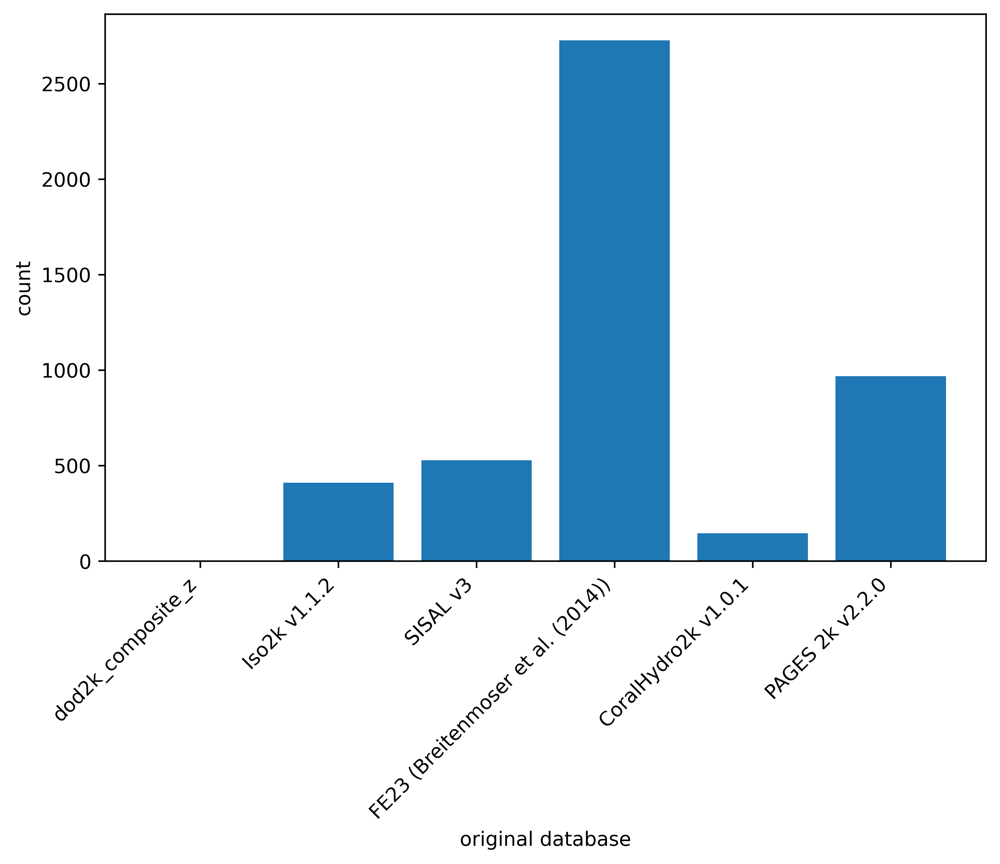

In [23]:

fig = plt.figure(figsize=(8, 5), dpi=500)
ax  = plt.gca()

plt.bar(originalDatabase_labels, [originalDatabase_count[od] for od in originalDatabase_labels])

ax.set_xticks(np.arange(len(originalDatabase_labels)), 
              originalDatabase_labels, 
              rotation=45, ha='right', fontsize=10)
plt.xlabel('original database')
plt.ylabel('count')

In [24]:
df['interpretation_variable']

0                                N/A
1                                N/A
2                                N/A
3                        temperature
4                                N/A
                    ...             
4776                             N/A
4777            temperature+moisture
4778                             N/A
4779                             N/A
4780    NOT temperature NOT moisture
Name: interpretation_variable, Length: 4781, dtype: object